# FORECASTING CASE STUDY - RETAILER X

## Instructions

**The following case study is intended to test how you would structure a solution for demand forecasting.**

You have been given a dataset for a retailer X who has stores across the country. Please suggest an approach or design a mix of approaches for forecasting sales at the category store week level.

 
**Data available :**

    1).   Macro_Economic_Data - Outlet	YEARWK	Temp	Gas_price_in_dollars 
    Consumer_price_Index	UnEmployment_rate

    2).   Outlets -  Outlet Outlet_Type Floor_Size

    3).   Holiday_Calendar - YEARWK	Is_A_Holiday_Flag

    4).   Heirarchy -  Dept	Category

    5).   Train data - Outlet	Category	YEARWK	Weekly_Sales

    6).   Test Data - Store	Category	YEARWK


There may be different types of time series - Stable, Sporadic, With lesser weeks of history etc. Please walk us through your approach to solve the exercise for both short term forecasting (<=6 weeks) and long term forecasting (6+ weeks)

You may use the colab notebook to create charts, do EDA etc to prepare your final forecasting data.


**Please do appropriate research to design the solution. More than one type of modeling may need to be used to solve the case study depending on the following**:

1. Forecasting horizon
2. Available Sales History
3. Sales patterns (sporadicity, stability)
3. Availability of additional features 


## Points to note

*   Please highlight relevant research/EDA (if any) to support your solution design.

*   While the data is provided to support the modeling exercise end to end, it is **not expected that you develop the models. That is optional**. 

*   The case study will be **evaluated on the solution design and suggested approaches**.

## Expected Output


The output should be the **python code for all the EDA, time series plots etc to arrive at the design of the overall solution and the overall recommendation of the solution **.

The deepnote notebook can be used to do all the EDA you want to do.





In [1]:
# import pandas as pd
# df = pd.read_csv('Data_Forecasting/Train_data.csv')
# df

FileNotFoundError: ignored

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------

# Solution

Author: Anish Mahapatra <br>
Email: anishmahapatra01@gmail.com

**Aim**

Create a demand forecasting approach or mix of approaches for forecasting sales at a **store-category-week** level

To do this, we have been given five relevant datasets
- **Macro_Economic_Data** - Macro economic data like Gas Price, Temperature, COnsumer Price Index and Unemployment rate at a Outlet and Year-week level
- **Outlets** - Further information on the outlet like Floor Type and Outlet Type (A, B, C) 
- **Holiday_Calendar** - Information on the week(s) that have a holiday
- **Train_Data** - Data at a store-category-week level (Weekly_Sales is the predictor variable)
- **Test_Data** - Store-Category-Week data is given, and we need to forecast the Weekly_Sales

Now, we need to understand what are the possible approaches we can take-up with this.





### Steps
- Join relevant tables
(Train_data, Macro_Economic_Data, Holiday_Calendar & Outlets)

- Perform data investigation
- Look for missing data, outliers
- Visualize the data and understand the time horizon
- Map out the Seasonality, Trend and noise in the data
- Perform Exploratory Data Analysis (Distribution plots, univariate analysis)
- Perform Bivariate analysis (Correlation)
- Understand if exponential smoothing, differencing and log transformations are needed for a stationary timeseries
- Perform forecast for the relevant time horizon
- Visualize data 
- Give out the approaches in a neat and concise format.


<a id='TOC'></a>
### Table of Contents

1. [Data Understanding](#1)
2. [Exploratory Data Analysis](#2)
3. [Visualize the data](#3)
4. [Test-Train Split](#4)
5. [Feature Scaling & Normalization](#5)
6. [Model Building](#6)
7. [Evaluation of Model](#7)

### Entity Relation (ER) Diagram 
(Made by Author - Anish via draw.io)
![ERDig_v1](https://github.com/anishmahapatra/DataScienceInterviewPrep/blob/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/ERDig_v1.drawio.png?raw=1)

<a id='1'></a>
### 1. Data Understanding

In [22]:
# Installing the required packages

! pip uninstall -y pandas-profiling &> /dev/null                # Package for pandas profiling - visualization
! pip install pandas-profiling[notebook,html] &> /dev/null      # Uninstalling and reinstalling it due to a bug in Google Colab
! pip install sweetviz &> /dev/null                             # Package for some sweet visualizations
! pip install -U dataprep &> /dev/null                          # Package for instant data preparation
! pip install --upgrade plotly &> /dev/null                     # Updating plotly to the latest version
! pip install jupyter-dash &> /dev/null                         # Installing jupyter-dash 
! pip install pydotplus &> /dev/null                            # Visualization library
! pip install eli5 &> /dev/null
! pip install lime &> /dev/null
! pip3 install catboost &> /dev/null

In [23]:
# Importing the required packages
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import linear_model
import matplotlib.pyplot as plt
import pandas_profiling                             # Automatic EDA
import sweetviz as sv                               # Importing sweetviz for some sweet visualizations
import seaborn as sns                               # Importing seaborn for visualization
import pandas as pd                                 # Importing pandas
import numpy as np                                  # Importing numpy
%matplotlib inline    
import warnings                                     # Importing package to toggle warnings
import IPython                                      # Importing ipython for displaying html files in the notebook
import seaborn as sns
import pandas as pd
import numpy as np
import datetime
import os

# Hide warnings
import warnings
warnings.filterwarnings('ignore')

# Removing the minimum display columns to 500
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)


In [4]:
holiday_calendar = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/holiday_calendar.csv')
Macro_Economic_Data = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/Macro_Economic_Data.csv')
Outlets = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/Outlets.csv')
Train_Data = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/Train_data.csv')
Test_data = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/Test_data.csv')

In [5]:
Train_Data.head()

,Outlet,Category,YEARWK,Weekly_Sales
0,1,1,201006,24930.50
1,1,1,201007,46045.49
2,1,1,201008,41601.55
3,1,1,201009,19409.54
4,1,1,201010,21833.90


In [6]:
Macro_Economic_Data.head()

,Outlet,YEARWK,Temp,Gas_price_in_dollars,Consumer_price_Index,UnEmployment_rate
0,1.0,201006.0,43.36,2.662,212.096358,7.606
1,1.0,201007.0,39.56,2.638,212.242170,7.606
2,1.0,201008.0,40.98,2.604,212.289143,7.606
3,1.0,201009.0,47.68,2.651,212.319643,7.606
4,1.0,201010.0,47.55,2.715,212.350143,7.606


In [7]:
trainData_macroEconomicData = pd.merge(Train_Data, Macro_Economic_Data, on=['Outlet', 'YEARWK'], how='left')
trainData_macroEconomicData.head()

,Outlet,Category,YEARWK,Weekly_Sales,Temp,Gas_price_in_dollars,Consumer_price_Index,UnEmployment_rate
0,1,1,201006,24930.50,43.36,2.662,212.096358,7.606
1,1,1,201007,46045.49,39.56,2.638,212.242170,7.606
2,1,1,201008,41601.55,40.98,2.604,212.289143,7.606
3,1,1,201009,19409.54,47.68,2.651,212.319643,7.606
4,1,1,201010,21833.90,47.55,2.715,212.350143,7.606


In [8]:
trainData_macroEconomicData_holidayData = pd.merge(trainData_macroEconomicData, holiday_calendar, on=['YEARWK'], how='left')
trainData_macroEconomicData_holidayData.head()

,Outlet,Category,YEARWK,Weekly_Sales,Temp,Gas_price_in_dollars,Consumer_price_Index,UnEmployment_rate,Is_A_Holiday_Flag
0,1,1,201006,24930.50,43.36,2.662,212.096358,7.606,False
1,1,1,201007,46045.49,39.56,2.638,212.242170,7.606,True
2,1,1,201008,41601.55,40.98,2.604,212.289143,7.606,False
3,1,1,201009,19409.54,47.68,2.651,212.319643,7.606,False
4,1,1,201010,21833.90,47.55,2.715,212.350143,7.606,False


In [9]:
trainData_macroEconomicData_holidayData_outlet = pd.merge(trainData_macroEconomicData_holidayData, Outlets, on=['Outlet'], how='left')
trainData_macroEconomicData_holidayData_outlet.head()

,Outlet,Category,YEARWK,Weekly_Sales,Temp,Gas_price_in_dollars,Consumer_price_Index,UnEmployment_rate,Is_A_Holiday_Flag,Outlet_Type,Floor_Size
0,1,1,201006,24930.50,43.36,2.662,212.096358,7.606,False,A,302630
1,1,1,201007,46045.49,39.56,2.638,212.242170,7.606,True,A,302630
2,1,1,201008,41601.55,40.98,2.604,212.289143,7.606,False,A,302630
3,1,1,201009,19409.54,47.68,2.651,212.319643,7.606,False,A,302630
4,1,1,201010,21833.90,47.55,2.715,212.350143,7.606,False,A,302630


##### Converting YEARWK to Year and Week

In [10]:
df = trainData_macroEconomicData_holidayData_outlet.copy(deep=True)

In [11]:
df['YEARWK'] = df['YEARWK'].astype(str)
df['Year'] = df['YEARWK'].str[:4]
df['Week'] = df['YEARWK'].str[4:]

In [12]:
# Viewing the shape of the data - (rows, columns)
df.shape

(382261, 13)

In [13]:
# Summary of the dataset
print(df.info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 382261 entries, 0 to 382260
Data columns (total 13 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Outlet                382261 non-null  int64  
 1   Category              382261 non-null  int64  
 2   YEARWK                382261 non-null  object 
 3   Weekly_Sales          382261 non-null  float64
 4   Temp                  337992 non-null  float64
 5   Gas_price_in_dollars  337992 non-null  float64
 6   Consumer_price_Index  337992 non-null  float64
 7   UnEmployment_rate     307424 non-null  float64
 8   Is_A_Holiday_Flag     382261 non-null  bool   
 9   Outlet_Type           382261 non-null  object 
 10  Floor_Size            382261 non-null  int64  
 11  Year                  382261 non-null  object 
 12  Week                  382261 non-null  object 
dtypes: bool(1), float64(5), int64(3), object(4)
memory usage: 38.3+ MB
None


In [14]:
# Printing all the columns with atleast one null value
df.columns[df.isna().any()].tolist()

['Temp', 'Gas_price_in_dollars', 'Consumer_price_Index', 'UnEmployment_rate']

In [15]:
print("The number of columns with atleast one NULL value(s) are: ", len(df.columns[df.isna().any()].tolist()))

The number of columns with atleast one NULL value(s) are:  4


In [16]:
# Visulalizing the percentage of missing values
missing = (df.isnull().sum() / len(df)) * 100
missing_df = pd.DataFrame({'Feature': df.columns,
                                 'missing (%)': round(missing,2)})

missing_df

,Feature,missing (%)
Outlet,Outlet,0.00
Category,Category,0.00
YEARWK,YEARWK,0.00
Weekly_Sales,Weekly_Sales,0.00
Temp,Temp,11.58
Gas_price_in_dollars,Gas_price_in_dollars,11.58
Consumer_price_Index,Consumer_price_Index,11.58
UnEmployment_rate,UnEmployment_rate,19.58
Is_A_Holiday_Flag,Is_A_Holiday_Flag,0.00
Outlet_Type,Outlet_Type,0.00


In [17]:
df.isnull().sum()

Outlet                      0
Category                    0
YEARWK                      0
Weekly_Sales                0
Temp                    44269
Gas_price_in_dollars    44269
Consumer_price_Index    44269
UnEmployment_rate       74837
Is_A_Holiday_Flag           0
Outlet_Type                 0
Floor_Size                  0
Year                        0
Week                        0
dtype: int64

In [18]:
df = df.reset_index()
df['week_date']=(df[['Year','Week']].astype(str)
                 .apply(lambda x:datetime.datetime.strptime('-W'.join(x) + '-1', "%Y-W%W-%w"),1))

In [19]:
from pandas_profiling import ProfileReport          # Pandas Profile to visualize the data

In [20]:
# Generating the profile report and feeding it into a variable
Profile = ProfileReport(df, title = 'Pandas Profiling Report', html = {'style':{'full_width':True}})

In [21]:
# Showcasing the Pandas Profiling Report for the Zomato Dataset
Profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
# We shall use the SweetViz analyze() function to generate a shareable .html file to analyze the dataset
sweetvizReport = sv.analyze(df)
sweetvizReport.show_html('SweetViz.html', open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report SweetViz.html was generated.



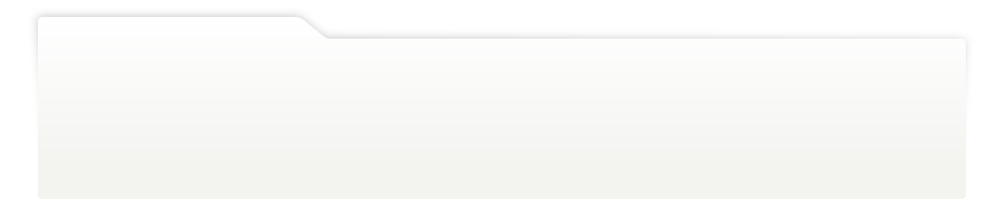
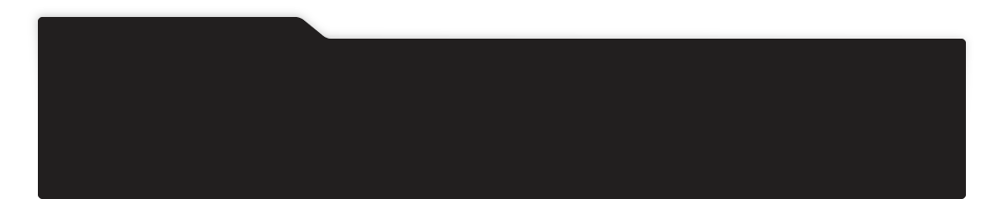
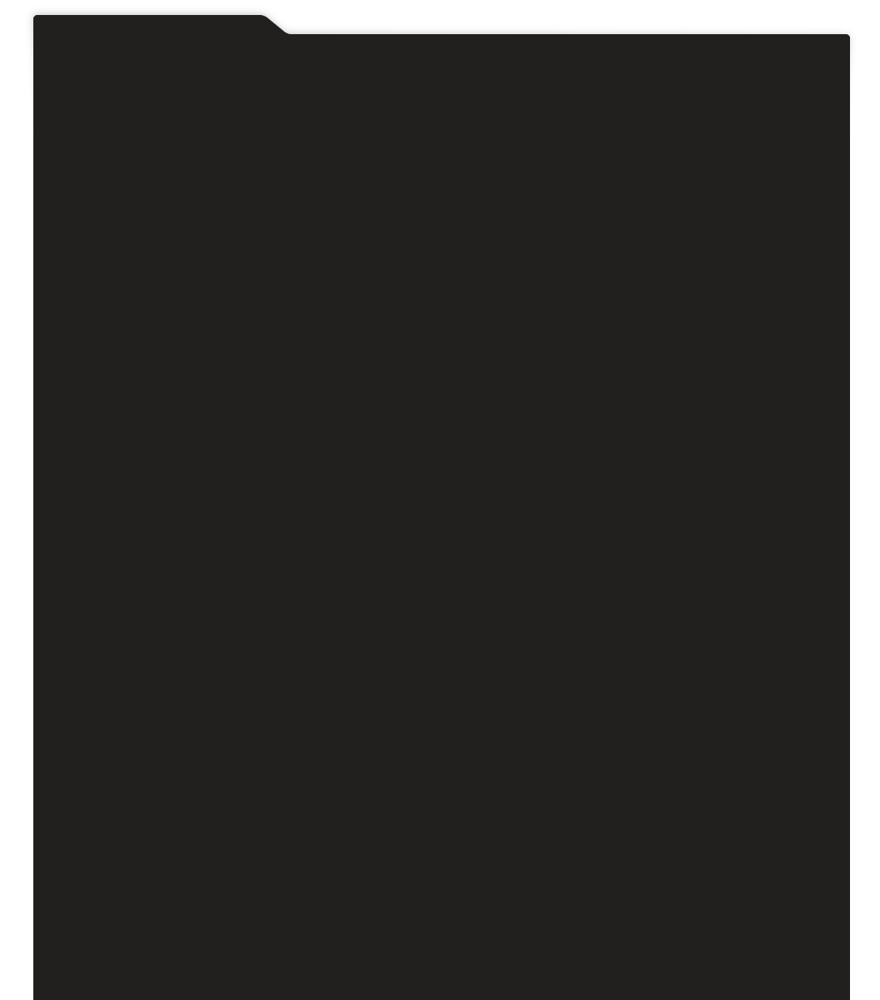
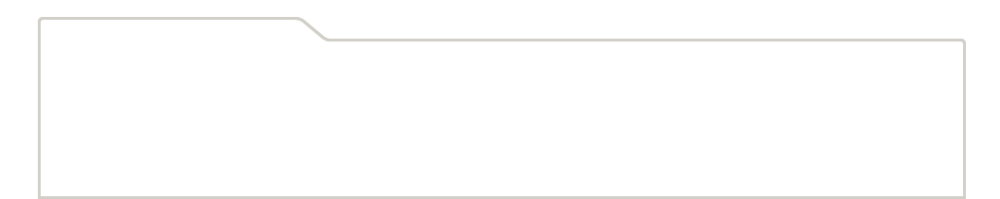
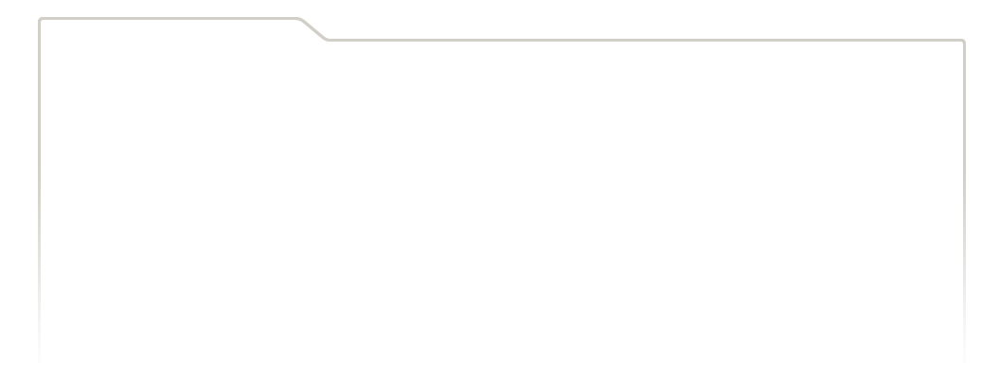
...
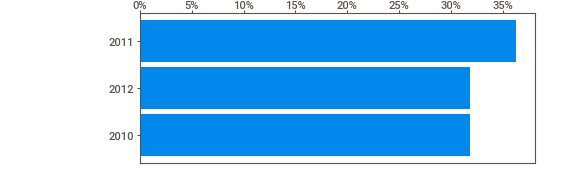
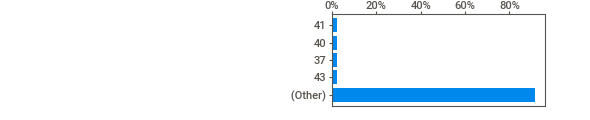
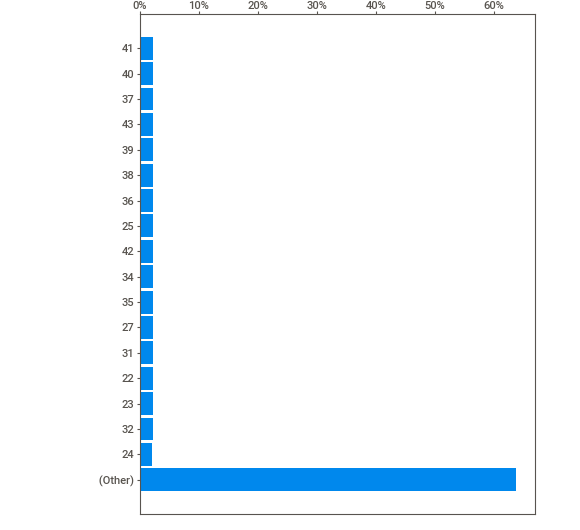
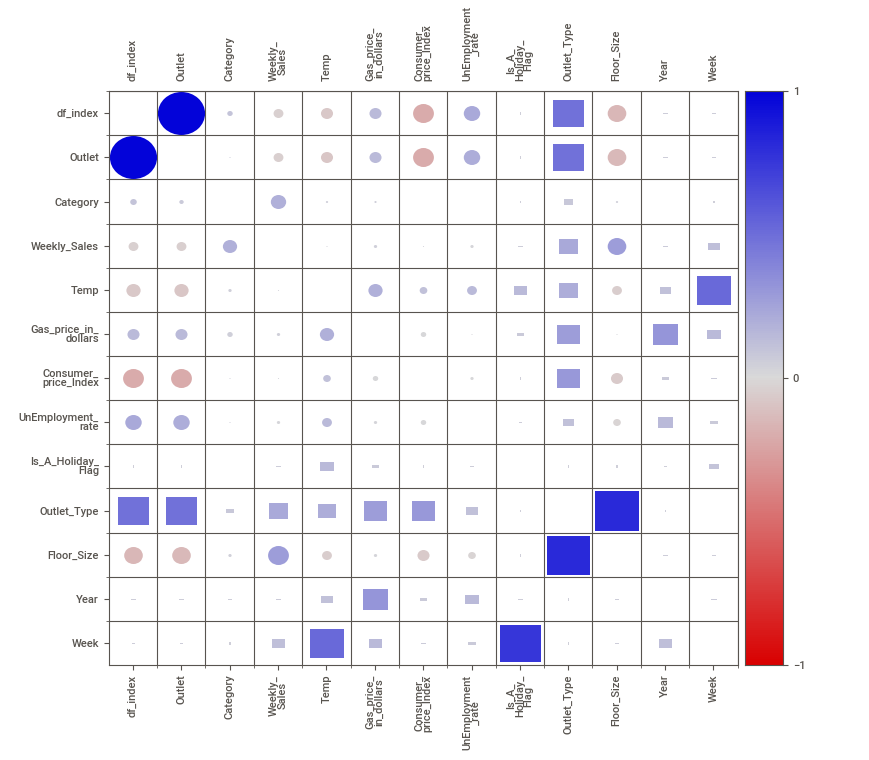
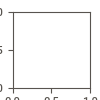

In [25]:
# Displaying the html file in the Google Colab notebook
IPython.display.HTML('SweetViz.html')

Data Understanding:
- Outlet: Corresponding outlet/store (There are outlets from 1 to 45)
- Category: Corresponding category (There are categories from 1 to 99)
- YEARWK: Corresponding Year-week combination (There is data from the year 2010, 2011 and 2012 and weeks from 06 to 43)
- Weekly_Sales: The weekly sales at a Store-Category-YEARWK level (Range: -4,982.94 to 693,105.36)

#### Exploratory Data Analysis of the Train Data

In [ ]:
# Let's look at the data - 
# we shall make a copy of the data and then use the variable 'df' to work through the rest of the dataset
df = Train_Data.copy(deep = True)
df.head()

,Outlet,Category,YEARWK,Weekly_Sales
0,1,1,201006,24930.50
1,1,1,201007,46045.49
2,1,1,201008,41601.55
3,1,1,201009,19409.54
4,1,1,201010,21833.90


Data Understanding:
- Outlet: Corresponding outlet/store (There are outlets from 1 to 45)
- Category: Corresponding category (There are categories from 1 to 99)
- YEARWK: Corresponding Year-week combination (There is data from the year 2010, 2011 and 2012 and weeks from 06 to 43)
- Weekly_Sales: The weekly sales at a Store-Category-YEARWK level (Range: -4,982.94 to 693,105.36)

In [ ]:
# Viewing the shape of the data - (rows, columns)
df.shape

(382261, 4)

In [ ]:
# Summary of the dataset
print(df.info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382261 entries, 0 to 382260
Data columns (total 4 columns):
Outlet          382261 non-null int64
Category        382261 non-null int64
YEARWK          382261 non-null int64
Weekly_Sales    382261 non-null float64
dtypes: float64(1), int64(3)
memory usage: 11.7 MB
None


In [ ]:
# Printing all the columns with atleast one null value
df.columns[df.isna().any()].tolist()

[]

In [ ]:
print("The number of columns with atleast one NULL value(s) are: ", len(df.columns[df.isna().any()].tolist()))

The number of columns with atleast one NULL value(s) are:  0


There are **no NULL values** present in the dataset

In [ ]:
# Visulalizing the percentage of missing values
missing = (df.isnull().sum() / len(df)) * 100
missing_df = pd.DataFrame({'Feature': df.columns,
                                 'missing (%)': round(missing,2)})

missing_df

,Feature,missing (%)
Outlet,Outlet,0.0
Category,Category,0.0
YEARWK,YEARWK,0.0
Weekly_Sales,Weekly_Sales,0.0


In [ ]:
df.isnull().sum()

Outlet          0
Category        0
YEARWK          0
Weekly_Sales    0
dtype: int64

The value to be predicted is Weekly_Sales

Extracting year and week number columns from YEARWK

In [ ]:
df = Train_Data.copy(deep = True)

In [ ]:
df['YEARWK'] = df['YEARWK'].astype(str)

In [ ]:
df['Year'] = df['YEARWK'].str[:4]
df['Week'] = df['YEARWK'].str[4:]

In [ ]:
df = df.drop(['YEARWK'], axis = 1)

In [ ]:
# Summary of the dataset
print(df.info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382261 entries, 0 to 382260
Data columns (total 5 columns):
Outlet          382261 non-null int64
Category        382261 non-null int64
Weekly_Sales    382261 non-null float64
Year            382261 non-null object
Week            382261 non-null object
dtypes: float64(1), int64(2), object(2)
memory usage: 14.6+ MB
None


In [ ]:
df = df.reset_index()
df['week_date']=(df[['Year','Week']].astype(str)
                 .apply(lambda x:datetime.datetime.strptime('-W'.join(x) + '-1', "%Y-W%W-%w"),1))



In [ ]:
df.head()

,index,Outlet,Category,Weekly_Sales,Year,Week,week_date
0,0,1,1,24930.50,2010,06,2010-02-08
1,1,1,1,46045.49,2010,07,2010-02-15
2,2,1,1,41601.55,2010,08,2010-02-22
3,3,1,1,19409.54,2010,09,2010-03-01
4,4,1,1,21833.90,2010,10,2010-03-08


In [ ]:
df_year = df.set_index(['Year'])
# reference: https://stackoverflow.com/questions/67697602/convert-week-number-in-dataframe-to-start-date-of-week-monday

In [ ]:
df_year_week = df.set_index(['Year', 'Week'])

In [ ]:
# df = df.drop(['index'], axis = 1)

In [ ]:
df

,index,Outlet,Category,Weekly_Sales,Year,Week,week_date
0,0,1,1,24930.50,2010,06,2010-02-08
1,1,1,1,46045.49,2010,07,2010-02-15
2,2,1,1,41601.55,2010,08,2010-02-22
3,3,1,1,19409.54,2010,09,2010-03-01
4,4,1,1,21833.90,2010,10,2010-03-08
...,...,...,...,...,...,...,...
382256,382256,45,98,514.37,2012,39,2012-09-24
382257,382257,45,98,634.10,2012,40,2012-10-01
382258,382258,45,98,1067.02,2012,41,2012-10-08
382259,382259,45,98,766.01,2012,42,2012-10-15


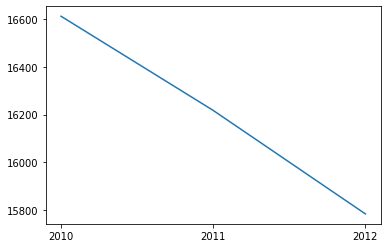

In [ ]:
plt.plot(df_year.groupby(df_year.index)["Weekly_Sales"].mean())

In [ ]:
df_year_week['Weekly_Sales'] = df_year_week['Weekly_Sales'].astype(int)

In [ ]:
df_week.head()

,index,Outlet,Category,Weekly_Sales,Year,Week
week_date,,,,,,
2010-02-08,0,1,1,24930.50,2010,06
2010-02-15,1,1,1,46045.49,2010,07
2010-02-22,2,1,1,41601.55,2010,08
2010-03-01,3,1,1,19409.54,2010,09
2010-03-08,4,1,1,21833.90,2010,10


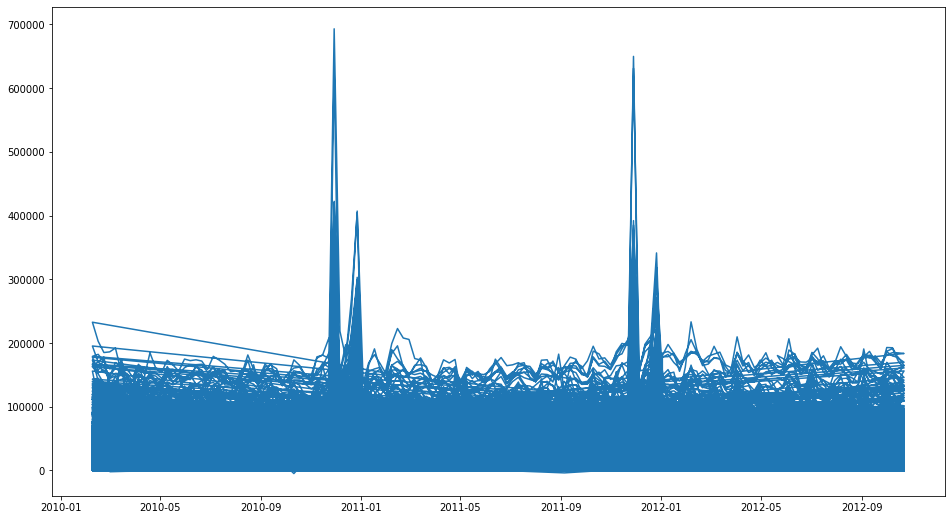

In [ ]:
df_week = df.set_index(['week_date'])
X = df_week.copy()
y = X.pop("Weekly_Sales")
plt.rcParams["figure.figsize"] = [16,9]
plt.plot(y)

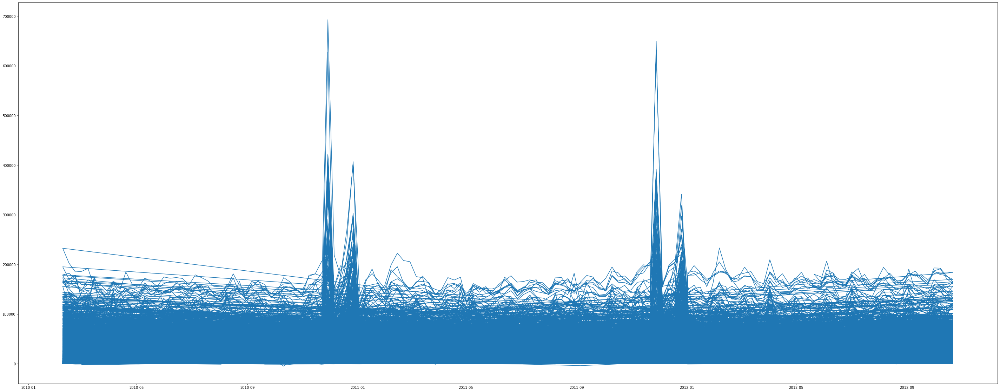

In [ ]:
df_only_week = df.set_index(['Week'])
X = df_week.copy()
y = X.pop("Weekly_Sales")
plt.rcParams["figure.figsize"] = [50,20]
plt.plot(y)

<AxesSubplot:xlabel='week_date'>

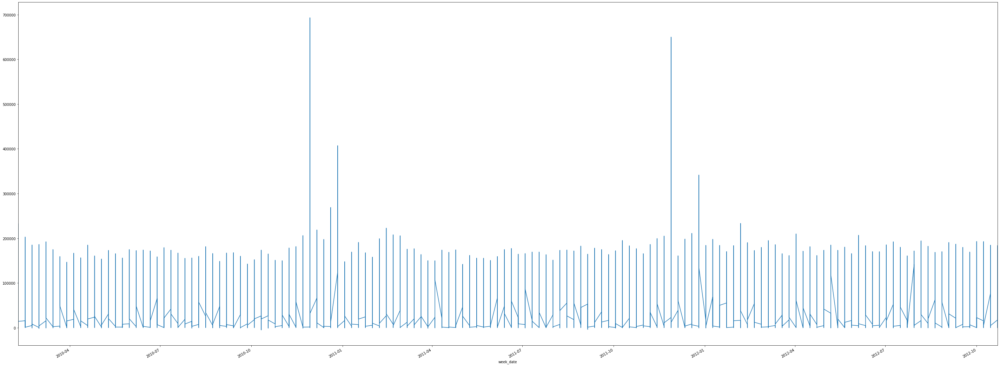

In [ ]:
df_week['Weekly_Sales'].plot()

In [ ]:
df['week_date'] = pd.to_datetime(df['week_date'], errors='coerce')
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382261 entries, 0 to 382260
Data columns (total 7 columns):
index           382261 non-null int64
Outlet          382261 non-null int64
Category        382261 non-null int64
Weekly_Sales    382261 non-null float64
Year            382261 non-null object
Week            382261 non-null object
week_date       382261 non-null datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(3), object(2)
memory usage: 20.4+ MB


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=a47afad5-0895-48b6-bedb-3e87dde9af8b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>